In [1]:
import os
import glob
import time
import sys
import random
import pillow_heif
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from glob import glob
from PIL import Image, UnidentifiedImageError, ImageOps
from scipy.linalg import sqrtm

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.image import ssim
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input

# CONFIGURATION

In [2]:
class CFG:
    BATCH_SIZE = 1
    BUFFER_SIZE = 200
    LAMBDA = 10
    LR_INITIAL = 2e-4
    LR_FINAL = 1e-4
    SEED = 7
    IDENTITY_WEIGHT = 5.0

def set_seed(seed):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(CFG.SEED)

# GPU SETUP

In [3]:
strategy = tf.distribute.get_strategy()
num_gpus = len(tf.config.list_physical_devices('GPU'))
print('TensorFlow : ', tf.__version__)
print('Python     : ', sys.version.split()[0])
print("Num GPUs Available : ", num_gpus)

if num_gpus > 0:
    print("✅ GPU")
else:
    print("❌ GPU")

TensorFlow :  2.10.1
Python     :  3.10.18
Num GPUs Available :  1
✅ GPU


In [4]:
try:
    tf.keras.mixed_precision.set_global_policy("float32")
    USE_MIXED = True
except Exception:
    USE_MIXED = False

# LOAD DATASET, PREPROCESS IMAGES & BUILD TF DATASET

In [5]:
day = r"C:\MATTHEW\DATASET\Train\Day"
night = r"C:\MATTHEW\DATASET\Train\Night"

day_dir = r"C:\MATTHEW\DATASET\Train\Resized 128 x 128\Day"
night_dir = r"C:\MATTHEW\DATASET\Train\Resized 128 x 128\Night"

os.makedirs(day_dir, exist_ok=True)
os.makedirs(night_dir, exist_ok=True)

def load_and_preprocess(path):
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (128, 128))
    img = (tf.cast(img, tf.float32) / 127.5) - 1.0
    return img

def make_dataset(folder, batch_size=1, shuffle=True):
    files = tf.io.gfile.glob(os.path.join(folder, "*.jpg"))
    ds = tf.data.Dataset.from_tensor_slices(files)
    if shuffle:
        ds = ds.shuffle(CFG.BUFFER_SIZE)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.repeat().batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

Day = make_dataset(day_dir)
Night = make_dataset(night_dir)
Train = tf.data.Dataset.zip((Day, Night))

# DATA PREPROCESSING

## SHOW IMAGE

In [6]:
def show_image(input_dir, title=""):
    file_list = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:40]
    plt.figure(figsize=(20, 4))
    for i, file_name in enumerate(file_list):
        img_path = os.path.join(input_dir, file_name)
        with Image.open(img_path) as img:
            plt.subplot(4, 10, i + 1)
            plt.imshow(img)
            plt.axis('off')
    plt.suptitle(title)
    plt.show()

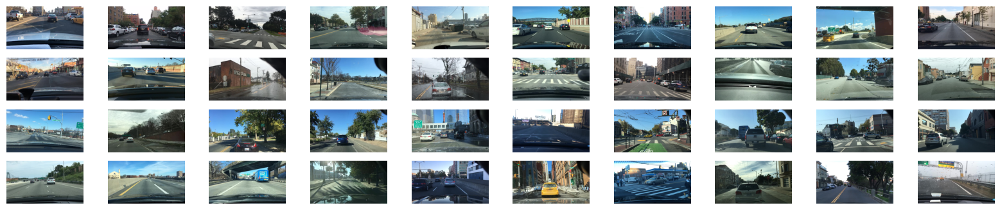

In [7]:
show_image(day)

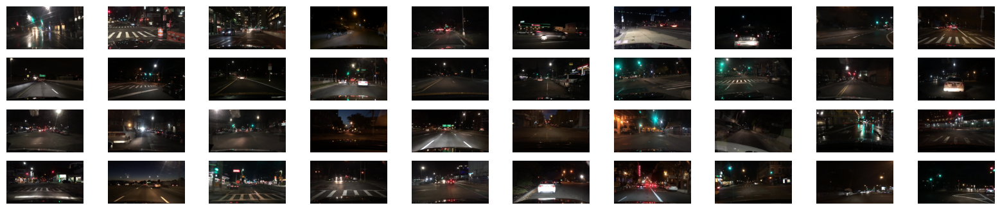

In [8]:
show_image(night)

## IMAGE SIZE

In [9]:
day_sample = os.path.join(day, os.listdir(day)[7])
night_sample = os.path.join(night, os.listdir(night)[2])

def visualize_image(image_path):
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)
    height, width = img_np.shape[:2]
    aspect_ratio = width / height
    fig_width = 8 * aspect_ratio
    fig_height = 8

    plt.figure(figsize=(fig_width, fig_height))
    plt.subplot(1, 1, 1)
    plt.imshow(img_np)
    plt.title(f"{width} x {height} x 3 image")
    plt.xlabel("Width (px)")
    plt.ylabel("Height (px)")

    plt.xticks(np.linspace(0, width, num=5, dtype=int))
    plt.yticks(np.linspace(0, height, num=5, dtype=int))
    plt.grid(True, linestyle="--", linewidth=0.5, color="white", alpha=0.7)

    plt.tight_layout()
    plt.show()

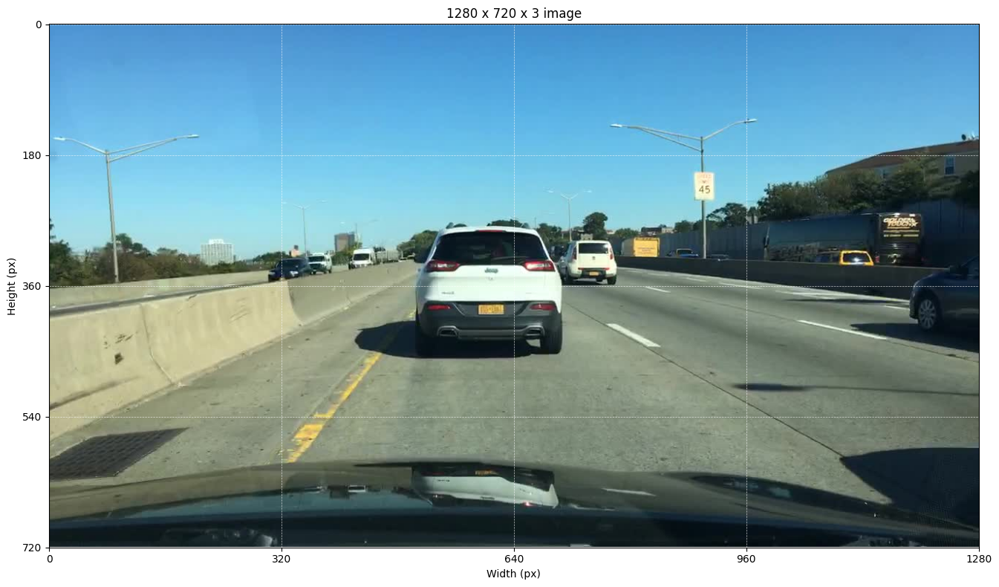

In [10]:
visualize_image(day_sample)

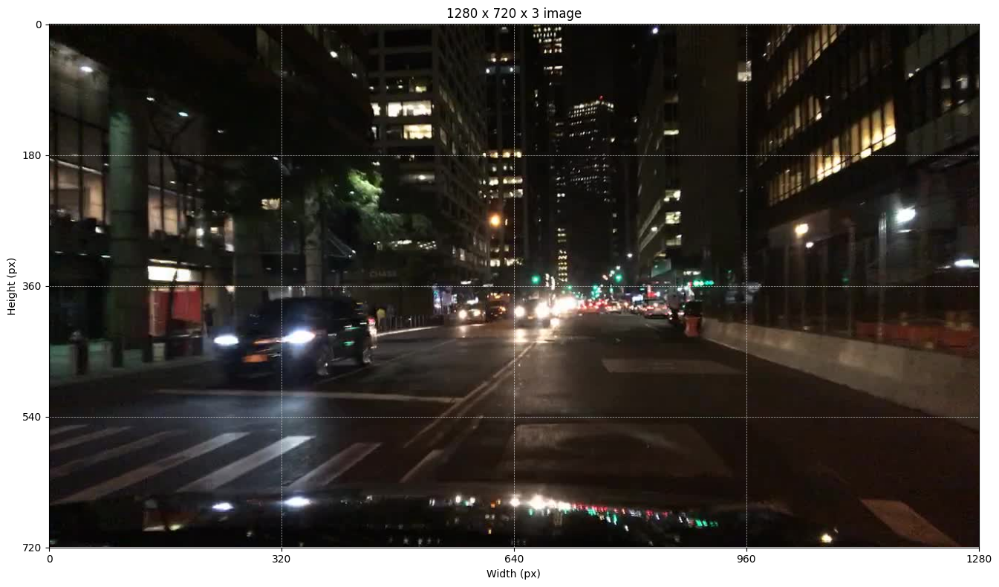

In [11]:
visualize_image(night_sample)

## IMAGE RESIZE

In [18]:
def resize_images(input_dir, output_dir, size=(128, 128)):
    files = [f for f in os.listdir(input_dir)
             if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    print(f"Resize dari folder: {input_dir}")
    print(f"Total file ditemukan: {len(files)}")

    for f in files:
        in_path = os.path.join(input_dir, f)
        out_path = os.path.join(output_dir, f)

        try:
            img = Image.open(in_path).convert("RGB")
            img = img.resize(size, Image.BILINEAR)
            img.save(out_path)
        except Exception as e:
            print(f"Gagal resize {f}: {e}")

resize_images(day, day_dir)
resize_images(night, night_dir)

Resize dari folder: C:\MATTHEW\DATASET\Train\Day
Total file ditemukan: 5000
Resize dari folder: C:\MATTHEW\DATASET\Train\Night
Total file ditemukan: 5000


In [12]:
def show_images(input_dir, title=""):
    file_list = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:20]
    plt.figure(figsize=(20, 5))
    for i, file_name in enumerate(file_list):
        img_path = os.path.join(input_dir, file_name)
        with Image.open(img_path) as img:
            plt.subplot(2, 10, i + 1)
            plt.imshow(img)
            plt.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

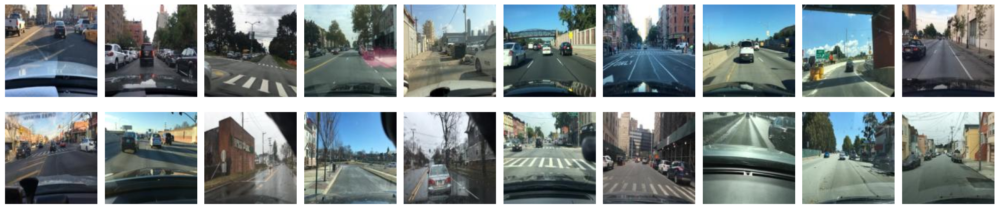

In [15]:
show_images(day_dir)

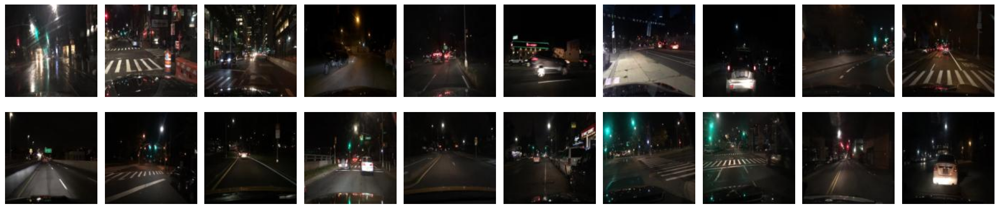

In [16]:
show_images(night_dir)

## AVERAGE IMAGE SIZE

In [17]:
day_files = [f for f in os.listdir(day_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
night_files = [f for f in os.listdir(night_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]

print(f"Total Day images   : {len(day_files)}")
print(f"Total Night images : {len(night_files)}")

sizes = []
for path in [day_dir, night_dir]:
    for f in os.listdir(path)[:50]:
        with Image.open(os.path.join(path, f)) as img:
            sizes.append(img.size)

sizes_df = pd.DataFrame(sizes, columns=["width", "height"])
print("\nAverage image size :")
print(sizes_df.describe())

Total Day images   : 5000
Total Night images : 5000

Average image size :
       width  height
count  100.0   100.0
mean   128.0   128.0
std      0.0     0.0
min    128.0   128.0
25%    128.0   128.0
50%    128.0   128.0
75%    128.0   128.0
max    128.0   128.0


# EXPLORATORY DATA ANALYSIS (EDA)

## IMAGE SIZE

In [25]:
def visualize_random(folder, size=128):
    files = [f for f in os.listdir(folder)
             if f.lower().endswith((".jpg", ".jpeg", ".png"))]

    if not files:
        raise ValueError("Folder tidak mengandung file gambar.")

    filename = np.random.choice(files)
    img_path = os.path.join(folder, filename)

    img = Image.open(img_path).convert("RGB").resize((size, size))
    img_np = np.array(img)

    plt.figure(figsize=(6, 6))
    plt.imshow(img_np)
    plt.title(f"{size} x {size} sample\n{filename}")
    plt.xlabel("Width (px)")
    plt.ylabel("Height (px)")

    step = size // 4
    plt.xticks(np.arange(0, size + 1, step))
    plt.yticks(np.arange(0, size + 1, step))
    plt.grid(True, linestyle="--", linewidth=0.4, color="white", alpha=0.6)
    plt.tight_layout()
    plt.show()

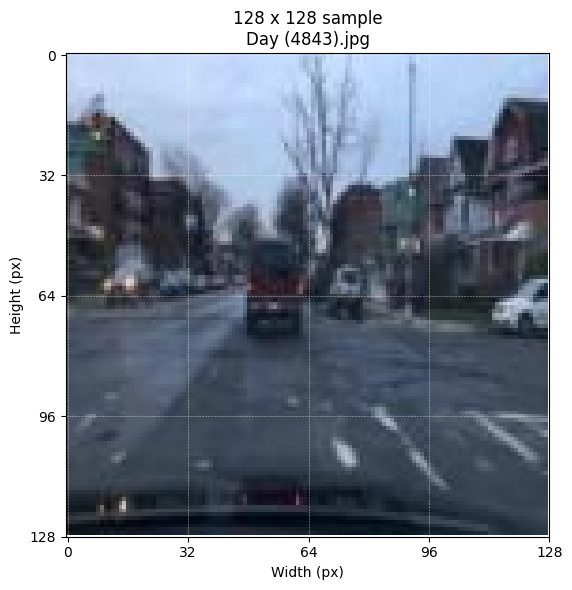

In [26]:
visualize_random(day_dir)

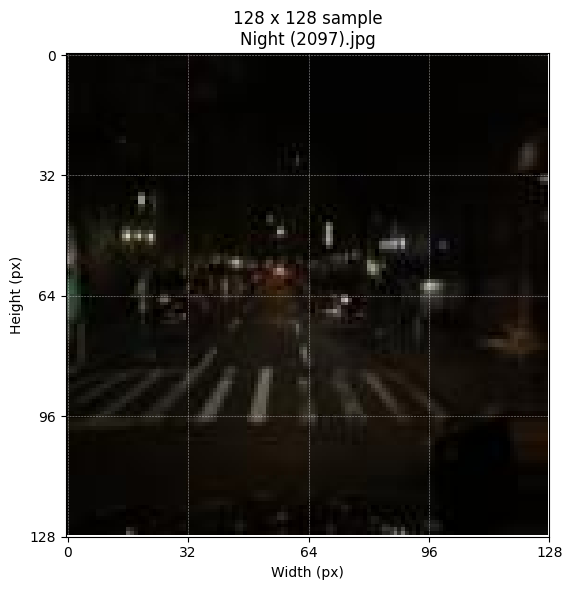

In [27]:
visualize_random(night_dir)

# NUMBER OF DATASETS

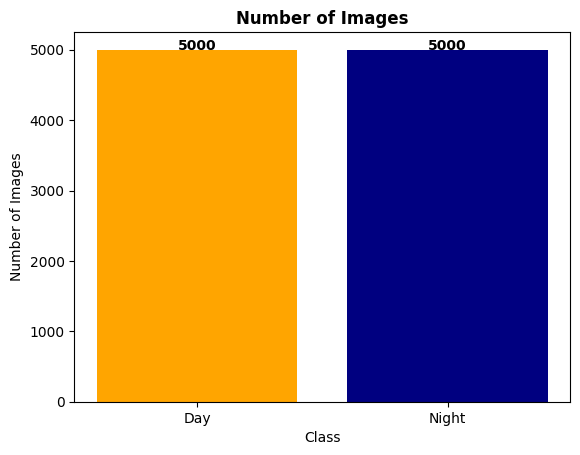

In [28]:
num_day = len([f for f in os.listdir(day_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))])
num_night = len([f for f in os.listdir(night_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))])

labels = ["Day", "Night"]
values = [num_day, num_night]
colors = ["orange", "navy"]

plt.bar(labels, values, color=colors)

for i, v in enumerate(values):
    plt.text(i, v + 2, str(v), ha='center', fontweight='bold', fontsize=10, color='black')

plt.title("Number of Images", fontsize=12, fontweight='bold')
plt.ylabel("Number of Images")
plt.xlabel("Class")
plt.show()

## RGB DISTRIBUTION

In [29]:
def visualize_RGB(image_path, title):
    img = np.array(Image.open(image_path).convert('RGB'))
    img = (img / 255.0)

    colors = ['red', 'green', 'blue']
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

    for i, color in enumerate(colors):
        plt.subplot(1, 4, i + 2)
        plt.hist((img[:, :, i] * 255).flatten(), bins=50, color=color, alpha=0.7)
        plt.title(f"{color.capitalize()} Channel")

    plt.tight_layout()
    plt.show()

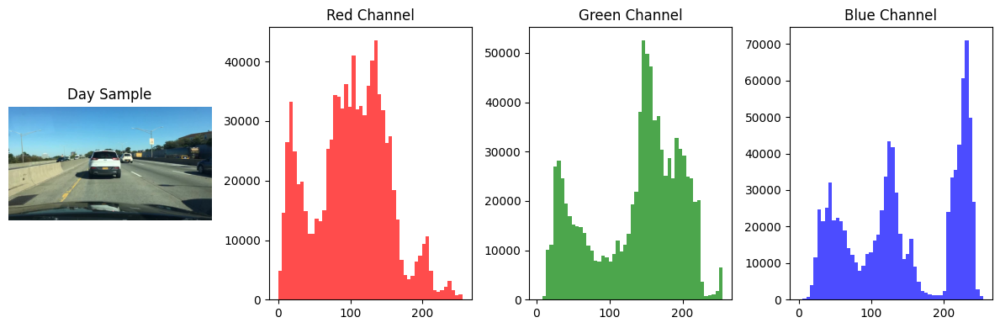

In [30]:
visualize_RGB(day_sample, "Day Sample")

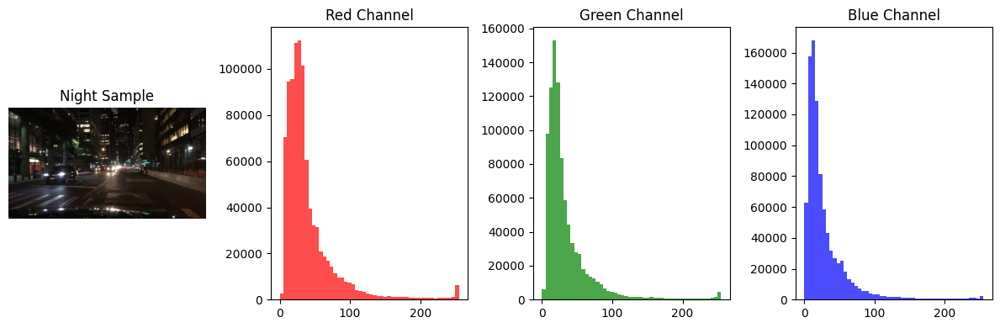

In [31]:
visualize_RGB(night_sample, "Night Sample")

## RGB CHANNEL MEAN DISTRIBUTION

In [32]:
def get_rgb_means(directory):
    means = []
    for f in os.listdir(directory)[:100]:
        with Image.open(os.path.join(directory, f)) as img:
            arr = np.array(img)
            means.append(arr.mean(axis=(0,1)))
    return np.array(means)

day_rgb = get_rgb_means(day_dir)
night_rgb = get_rgb_means(night_dir)

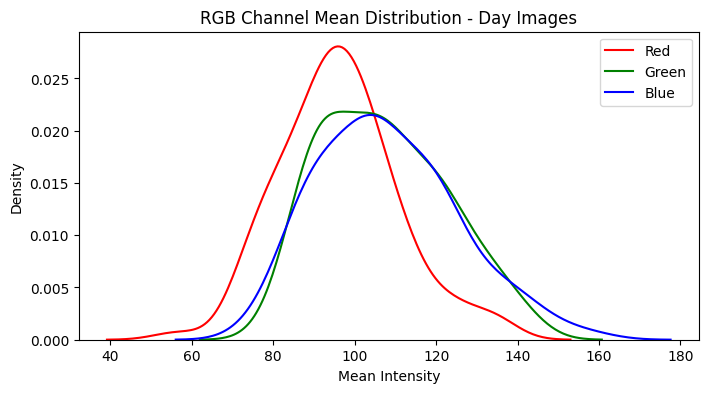

In [33]:
plt.figure(figsize=(8,4))
sns.kdeplot(day_rgb[:,0], label='Red', color='r')
sns.kdeplot(day_rgb[:,1], label='Green', color='g')
sns.kdeplot(day_rgb[:,2], label='Blue', color='b')
plt.title("RGB Channel Mean Distribution - Day Images")
plt.xlabel("Mean Intensity")
plt.ylabel("Density")
plt.legend()
plt.show()

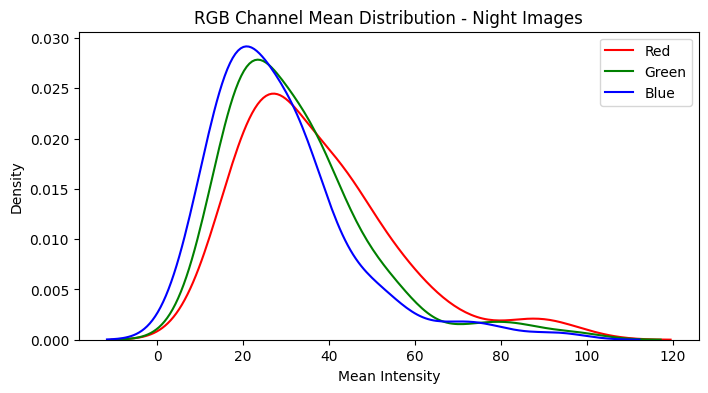

In [34]:
plt.figure(figsize=(8,4))
sns.kdeplot(night_rgb[:,0], label='Red', color='r')
sns.kdeplot(night_rgb[:,1], label='Green', color='g')
sns.kdeplot(night_rgb[:,2], label='Blue', color='b')
plt.title("RGB Channel Mean Distribution - Night Images")
plt.xlabel("Mean Intensity")
plt.ylabel("Density")
plt.legend()
plt.show()

## BRIGHTNESS DISTRIBUTION

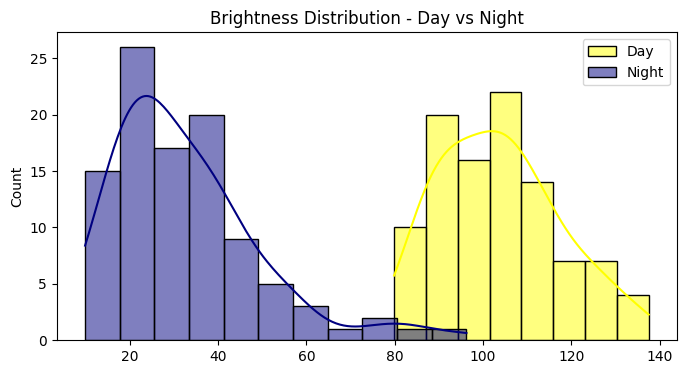

In [35]:
def brightness(img_array):
    return np.mean(img_array)

day_brightness = [brightness(np.array(Image.open(os.path.join(day_dir, f))))
    for f in day_files[:100]
]
night_brightness = [brightness(np.array(Image.open(os.path.join(night_dir, f))))
    for f in night_files[:100]
]

plt.figure(figsize=(8,4))
sns.histplot(day_brightness, color='yellow', label='Day', kde=True)
sns.histplot(night_brightness, color='navy', label='Night', kde=True)
plt.title("Brightness Distribution - Day vs Night")
plt.legend()
plt.show()

## COLOR CHANNEL CORRELATION

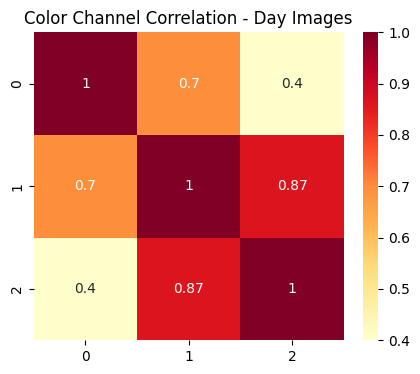

In [36]:
corr_day = np.corrcoef(day_rgb.T)
corr_night = np.corrcoef(night_rgb.T)

plt.figure(figsize=(5,4))
sns.heatmap(corr_day, annot=True, cmap='YlOrRd')
plt.title("Color Channel Correlation - Day Images")
plt.show()

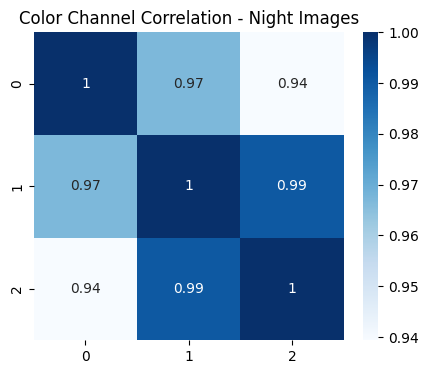

In [37]:
plt.figure(figsize=(5,4))
sns.heatmap(corr_night, annot=True, cmap='Blues')
plt.title("Color Channel Correlation - Night Images")
plt.show()

# IMAGE POOL

In [6]:
class ImagePool:
    def __init__(self, size=50):
        self.size = size
        self.images = []

    def query(self, image):
        if len(self.images) < self.size:
            self.images.append(image)
            return image
        if random.random() > 0.5:
            idx = random.randint(0, self.size - 1)
            tmp = self.images[idx]
            self.images[idx] = image
            return tmp
        return image

In [7]:
ID_WEIGHT = 10.0
PERC_WEIGHT = 0.4
RELIGHT_WEIGHT = 0.2
R1_GAMMA = 10.0

vgg = VGG19(include_top=False, weights="imagenet")
vgg.trainable = False
vgg_layers = ["block2_conv2", "block3_conv3", "block4_conv3"]
feat_extractor = tf.keras.Model(inputs=vgg.input, outputs=[vgg.get_layer(l).output for l in vgg_layers])

def preprocess_for_vgg(x):
    x255 = (x + 1.0) * 127.5
    x_resized = tf.image.resize(x255, (224, 224))
    return preprocess_input(x_resized)

def perceptual_loss(real, fake):
    r = preprocess_for_vgg(real)
    f = preprocess_for_vgg(fake)
    r_feats = feat_extractor(r)
    f_feats = feat_extractor(f)
    loss = 0.0
    for rf, ff in zip(r_feats, f_feats):
        loss += tf.reduce_mean(tf.abs(rf - ff))
    return loss / float(len(r_feats))

def relighting_loss(real, fake):
    real_lum = tf.reduce_mean(real, axis=[1,2,3])
    fake_lum = tf.reduce_mean(fake, axis=[1,2,3])
    return tf.reduce_mean(tf.abs(real_lum - fake_lum))

# REFELECTION PADDING 

In [8]:
class ReflectionPadding2D(tf.keras.layers.Layer):
    def __init__(self, padding=(1,1)):
        super().__init__()
        self.padding = padding
    def call(self, x):
        p_h, p_w = self.padding
        return tf.pad(x, [[0,0],[p_h,p_h],[p_w,p_w],[0,0]], mode="REFLECT")

# RESIDUAL BLOCK

In [9]:
initializer = tf.random_normal_initializer(0., 0.02)

def resblock(x, filters):
    y = ReflectionPadding2D((1,1))(x)
    y = tf.keras.layers.Conv2D(filters, 3, padding="valid", use_bias=False,kernel_initializer=initializer)(y)
    y = tfa.layers.InstanceNormalization()(y)
    y = tf.keras.layers.ReLU()(y)
    y = ReflectionPadding2D((1,1))(y)
    y = tf.keras.layers.Conv2D(filters, 3, padding="valid", use_bias=False,kernel_initializer=initializer)(y)
    y = tfa.layers.InstanceNormalization()(y)
    return tf.keras.layers.Add()([x, y])

# BUILD GENERATOR

In [10]:
def self_attention(x, filters):
    f = tf.keras.layers.Conv2D(filters // 8, 1, padding="same")(x)
    g = tf.keras.layers.Conv2D(filters // 8, 1, padding="same")(x)
    h = tf.keras.layers.Conv2D(filters, 1, padding="same")(x)
    B, H, W, C = x.shape
    f_flat = tf.reshape(f, (-1, H*W, C//8))
    g_flat = tf.reshape(g, (-1, H*W, C//8))
    h_flat = tf.reshape(h, (-1, H*W, C))
    beta = tf.nn.softmax(tf.matmul(g_flat, f_flat, transpose_b=True))
    o = tf.matmul(beta, h_flat)
    o = tf.reshape(o, (-1, H, W, C))
    o = tf.keras.layers.Conv2D(filters, 1, padding="same")(o)
    return tf.keras.layers.Add()([o, x])


def build_generator():
    inputs = tf.keras.Input(shape=(128,128,3))

    x = ReflectionPadding2D((3,3))(inputs)
    x = tf.keras.layers.Conv2D(64, 7, padding="valid", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(128, 3, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(256, 3, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    for _ in range(6):
        x = resblock(x, 256)

    x = self_attention(x, 256)

    x = tf.keras.layers.UpSampling2D(size=2, interpolation="nearest")(x)
    x = tf.keras.layers.Conv2D(128, 3, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.UpSampling2D(size=2, interpolation="nearest")(x)
    x = tf.keras.layers.Conv2D(64, 3, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = ReflectionPadding2D((3,3))(x)
    out = tf.keras.layers.Conv2D(3, 7, padding="valid", activation="tanh", kernel_initializer=initializer)(x)

    return tf.keras.Model(inputs=inputs, outputs=out, name="Generator")

# BUILD DISCRIMINATOR

In [11]:
def build_discriminator():
    inp = tf.keras.Input(shape=(128,128,3))

    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding="same", kernel_initializer=initializer)(inp)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(512, 4, strides=1, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    out = tf.keras.layers.Conv2D(1, 4, strides=1, padding="same", kernel_initializer=initializer)(x)
    return tf.keras.Model(inputs=inp, outputs=out, name="PatchGAN")

# MODEL SUMMARY GENERATOR

In [12]:
generator = build_generator()
generator.summary()

Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 reflection_padding2d (Reflecti  (None, 134, 134, 3)  0          ['input_2[0][0]']                
 onPadding2D)                                                                                     
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  9408        ['reflection_padding2d[0][0]']   
                                )                                                         

# LAYER GENERATOR

In [13]:
for i, layer in enumerate(generator.layers):
    print(
        f"{i:03d} | {layer.name:30s} "
        f"| shape : {layer.output_shape} "
        f"| params : {layer.count_params()}"
    )

000 | input_2                        | shape : [(None, 128, 128, 3)] | params : 0
001 | reflection_padding2d           | shape : (None, 134, 134, 3) | params : 0
002 | conv2d                         | shape : (None, 128, 128, 64) | params : 9408
003 | instance_normalization         | shape : (None, 128, 128, 64) | params : 128
004 | re_lu                          | shape : (None, 128, 128, 64) | params : 0
005 | conv2d_1                       | shape : (None, 64, 64, 128) | params : 73728
006 | instance_normalization_1       | shape : (None, 64, 64, 128) | params : 256
007 | re_lu_1                        | shape : (None, 64, 64, 128) | params : 0
008 | conv2d_2                       | shape : (None, 32, 32, 256) | params : 294912
009 | instance_normalization_2       | shape : (None, 32, 32, 256) | params : 512
010 | re_lu_2                        | shape : (None, 32, 32, 256) | params : 0
011 | reflection_padding2d_1         | shape : (None, 34, 34, 256) | params : 0
012 | conv2d_3   

# MODEL SUMMARY DISCRIMINATOR

In [14]:
discriminator = build_discriminator()
discriminator.summary()

Model: "PatchGAN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_22 (Conv2D)          (None, 64, 64, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 64)        0         
                                                                 
 conv2d_23 (Conv2D)          (None, 32, 32, 128)       131072    
                                                                 
 instance_normalization_17 (  (None, 32, 32, 128)      256       
 InstanceNormalization)                                          
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                          

# LAYER DISCRIMINATOR

In [15]:
for i, layer in enumerate(discriminator.layers):
    print(
        f"{i:03d} | {layer.name:30s} "
        f"| shape : {layer.output_shape} "
        f"| params : {layer.count_params()}"
    )

000 | input_3                        | shape : [(None, 128, 128, 3)] | params : 0
001 | conv2d_22                      | shape : (None, 64, 64, 64) | params : 3136
002 | leaky_re_lu                    | shape : (None, 64, 64, 64) | params : 0
003 | conv2d_23                      | shape : (None, 32, 32, 128) | params : 131072
004 | instance_normalization_17      | shape : (None, 32, 32, 128) | params : 256
005 | leaky_re_lu_1                  | shape : (None, 32, 32, 128) | params : 0
006 | conv2d_24                      | shape : (None, 16, 16, 256) | params : 524288
007 | instance_normalization_18      | shape : (None, 16, 16, 256) | params : 512
008 | leaky_re_lu_2                  | shape : (None, 16, 16, 256) | params : 0
009 | conv2d_25                      | shape : (None, 16, 16, 512) | params : 2097152
010 | instance_normalization_19      | shape : (None, 16, 16, 512) | params : 1024
011 | leaky_re_lu_3                  | shape : (None, 16, 16, 512) | params : 0
012 | conv2d_2

# LOSS FUNCTIONS

In [16]:
mse = tf.keras.losses.MeanSquaredError()
def gen_gan_loss(fake):
    return mse(tf.ones_like(fake), fake)

def disc_gan_loss(real, fake):
    return 0.5 * (mse(tf.ones_like(real), real) + mse(tf.zeros_like(fake), fake))

def cycle_loss(real, cycled):
    return CFG.LAMBDA * tf.reduce_mean(tf.abs(real - cycled))

def identity_loss(real, same):
    return ID_WEIGHT * tf.reduce_mean(tf.abs(real - same))

# CYCLE GAN MODEL

In [17]:
class CycleGAN(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.Gd2n = build_generator()
        self.Gn2d = build_generator()
        self.Dn = build_discriminator()
        self.Dd = build_discriminator()
        self.pool_n = ImagePool(50)
        self.pool_d = ImagePool(50)

    def compile(self, g_optimizer, d_optimizer):
        super().compile()
        self.g_opt = g_optimizer
        self.d_opt = d_optimizer

    def train_step(self, batch):
        day, night = batch  # each is shape (B, H, W, 3)

        with tf.GradientTape(persistent=True) as tape:
            # watch real images for R1 regularizer
            tape.watch(day)
            tape.watch(night)

            # Generator forward (connected graph)
            fake_night = self.Gd2n(day, training=True)
            fake_day   = self.Gn2d(night, training=True)

            cycled_day   = self.Gn2d(fake_night, training=True)
            cycled_night = self.Gd2n(fake_day, training=True)

            same_day   = self.Gn2d(day, training=True)
            same_night = self.Gd2n(night, training=True)

            # Create pool replay items but DO NOT use pool outputs for
            # generator adversarial loss (we want generator gradients).
            # For discriminator loss, use stop_gradient over pool item so
            # discriminator grads exist but generator doesn't receive grads via pool.
            fake_n_pool = self.pool_n.query(fake_night)
            fake_d_pool = self.pool_d.query(fake_day)

            # Discriminator forward
            # For generator adversarial loss use connected fake tensors:
            dn_real = self.Dn(night, training=True)
            dn_fake_for_gen = self.Dn(fake_night, training=True)

            dd_real = self.Dd(day, training=True)
            dd_fake_for_gen = self.Dd(fake_day, training=True)

            # For discriminator loss use pool items but wrapped with stop_gradient
            # so generator doesn't get gradients through the pool. Discriminator still receives grads.
            dn_fake_for_disc = self.Dn(tf.stop_gradient(fake_n_pool), training=True)
            dd_fake_for_disc = self.Dd(tf.stop_gradient(fake_d_pool), training=True)

            # Generator adversarial losses (based on connected fake outputs)
            g_loss_d2n = gen_gan_loss(dn_fake_for_gen)
            g_loss_n2d = gen_gan_loss(dd_fake_for_gen)

            # cycle + identity
            cyc_A = cycle_loss(day, cycled_day)
            cyc_B = cycle_loss(night, cycled_night)
            id_loss_val = identity_loss(day, same_day) + identity_loss(night, same_night)

            # perceptual + relight
            p_loss = perceptual_loss(day, fake_day) + perceptual_loss(night, fake_night)
            r_loss = relighting_loss(day, fake_day) + relighting_loss(night, fake_night)

            total_g = (
                g_loss_d2n + g_loss_n2d
                + cyc_A + cyc_B
                + id_loss_val
                + PERC_WEIGHT * p_loss
                + RELIGHT_WEIGHT * r_loss
            )

            # Discriminator losses (use pool versions for stability)
            d_loss_n = disc_gan_loss(dn_real, dn_fake_for_disc)
            d_loss_d = disc_gan_loss(dd_real, dd_fake_for_disc)

            # R1 regularization (grad of D outputs w.r.t. real images)
            dn_real_sum = tf.reduce_sum(dn_real)
            dd_real_sum = tf.reduce_sum(dd_real)

        # compute gradients of discriminator outputs w.r.t. real images for R1
        grad_dn_real = tape.gradient(dn_real_sum, night)
        grad_dd_real = tape.gradient(dd_real_sum, day)

        r1_n = 0.0 if grad_dn_real is None else tf.reduce_mean(tf.square(grad_dn_real))
        r1_d = 0.0 if grad_dd_real is None else tf.reduce_mean(tf.square(grad_dd_real))

        r1_term_n = 0.5 * R1_GAMMA * r1_n
        r1_term_d = 0.5 * R1_GAMMA * r1_d

        d_loss_n = d_loss_n + r1_term_n
        d_loss_d = d_loss_d + r1_term_d

        total_d = d_loss_n + d_loss_d

        # Gradients & apply
        g_vars = self.Gd2n.trainable_variables + self.Gn2d.trainable_variables
        d_vars = self.Dn.trainable_variables + self.Dd.trainable_variables

        g_grads = tape.gradient(total_g, g_vars)
        d_grads = tape.gradient(total_d, d_vars)

        # defensive: replace None grads with zeros (prevents ValueError in optimizer)
        g_grads = [g if g is not None else tf.zeros_like(v) for g, v in zip(g_grads, g_vars)]
        d_grads = [g if g is not None else tf.zeros_like(v) for g, v in zip(d_grads, d_vars)]

        self.g_opt.apply_gradients(zip(g_grads, g_vars))
        self.d_opt.apply_gradients(zip(d_grads, d_vars))

        del tape

        # Metrics
        return {
            "g_loss": total_g,
            "d_loss": total_d,
            "cycle_A": cyc_A,
            "cycle_B": cyc_B,
            "identity": id_loss_val,
            "perc_loss": p_loss,
            "relight_loss": r_loss,
            "r1_n": r1_term_n,
            "r1_d": r1_term_d,
            "grad_g": tf.linalg.global_norm(g_grads),
            "grad_d": tf.linalg.global_norm(d_grads),
            "g_acc": tf.reduce_mean(tf.cast(self.Dn(fake_night) > 0.5, tf.float32)),
            "d_acc": (tf.reduce_mean(tf.cast(dn_real > 0.5, tf.float32)) +
                      tf.reduce_mean(tf.cast(dn_fake_for_disc < 0.5, tf.float32))) / 2.0
        }

# CALLBACK HISTORY

In [18]:
class LossHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.g_losses = []
        self.d_losses = []
        self.g_accs = []
        self.d_accs = []
        self.cycle_A = []
        self.cycle_B = []
        self.identity = []
        self.grad_g = []
        self.grad_d = []

    def on_epoch_end(self, epoch, logs=None):
        self.g_losses.append(logs.get("g_loss"))
        self.d_losses.append(logs.get("d_loss"))
        self.g_accs.append(logs.get("g_acc"))
        self.d_accs.append(logs.get("d_acc"))
        self.cycle_A.append(logs.get("cycle_A"))
        self.cycle_B.append(logs.get("cycle_B"))
        self.identity.append(logs.get("identity"))
        self.grad_g.append(logs.get("grad_g"))
        self.grad_d.append(logs.get("grad_d"))

# TRAINING SETUP

In [19]:
EPOCHS = 40
steps = 800

def linear_decay_gen(epoch):
    if epoch < EPOCHS // 2:
        return float(CFG.LR_INITIAL)
    else:
        t = (epoch - EPOCHS // 2) / float(EPOCHS // 2)
        return float(CFG.LR_INITIAL + t * (CFG.LR_FINAL - CFG.LR_INITIAL))

class DualLRScheduler(tf.keras.callbacks.Callback):
    def __init__(self, discr_scale=0.25):
        super().__init__()
        self.discr_scale = discr_scale
    def on_epoch_begin(self, epoch, logs=None):
        new_lr_gen = linear_decay_gen(epoch)
        try:
            self.model.g_opt.lr.assign(new_lr_gen)
        except Exception:
            tf.keras.backend.set_value(self.model.g_opt.learning_rate, new_lr_gen)
        new_lr_disc = new_lr_gen * self.discr_scale
        try:
            self.model.d_opt.lr.assign(new_lr_disc)
        except Exception:
            tf.keras.backend.set_value(self.model.d_opt.learning_rate, new_lr_disc)
        print(f"\n[DualLRScheduler] Epoch {epoch+1}: gen_lr = {new_lr_gen:.2e}, disc_lr = {new_lr_disc:.2e}")

In [20]:
gan = CycleGAN()

g_opt = tf.keras.optimizers.Adam(CFG.LR_INITIAL, beta_1=0.5)
d_opt = tf.keras.optimizers.Adam(CFG.LR_INITIAL * 0.25, beta_1=0.5)

gan.compile(g_opt, d_opt)

loss_history = LossHistory()
lr_callback = DualLRScheduler(discr_scale=0.25)

start_time = time.time()

gan.fit(Train, epochs=EPOCHS, steps_per_epoch=steps, callbacks=[loss_history, lr_callback])

end_time = time.time()
total_seconds = end_time - start_time
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)
seconds = int(total_seconds % 60)
print(f"{hours} Hours {minutes} Minutes {seconds} Seconds")


[DualLRScheduler] Epoch 1: gen_lr = 2.00e-04, disc_lr = 5.00e-05
Epoch 1/40
800/800 [==============================] - 606s 709ms/step - g_loss: 135.0514 - d_loss: 3.0118 - cycle_A: 4.6342 - cycle_B: 2.4501 - identity: 6.8291 - perc_loss: 295.4455 - relight_loss: 0.5427 - r1_n: 0.3041 - r1_d: 0.1084 - grad_g: 643.5438 - grad_d: 0.0000e+00 - g_acc: 0.5245 - d_acc: 0.5212

[DualLRScheduler] Epoch 2: gen_lr = 2.00e-04, disc_lr = 5.00e-05
Epoch 2/40
800/800 [==============================] - 565s 707ms/step - g_loss: 126.1351 - d_loss: 2.9510 - cycle_A: 3.2966 - cycle_B: 2.1729 - identity: 4.9606 - perc_loss: 282.3452 - relight_loss: 0.3402 - r1_n: 0.3010 - r1_d: 0.1089 - grad_g: 396.4315 - grad_d: 0.0000e+00 - g_acc: 0.5151 - d_acc: 0.5268

[DualLRScheduler] Epoch 3: gen_lr = 2.00e-04, disc_lr = 5.00e-05
Epoch 3/40
800/800 [==============================] - 565s 706ms/step - g_loss: 125.5891 - d_loss: 2.9330 - cycle_A: 3.1779 - cycle_B: 2.2214 - identity: 5.1750 - perc_loss: 280.8645 - r

# GENERATOR LOSS

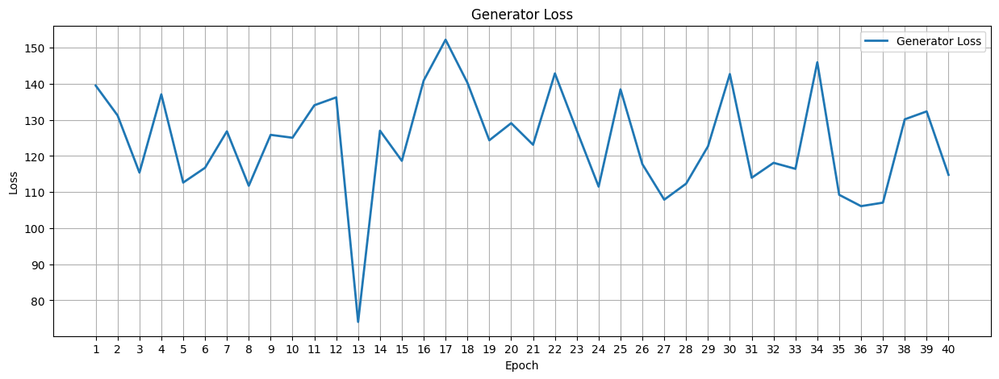

In [21]:
plt.figure(figsize=(15, 5))
epochs = list(range(1, len(loss_history.g_losses) + 1))
plt.plot(epochs, loss_history.g_losses, label="Generator Loss", linewidth=2)
plt.xticks(epochs)  
plt.title("Generator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# DISCRIMINATOR LOSS

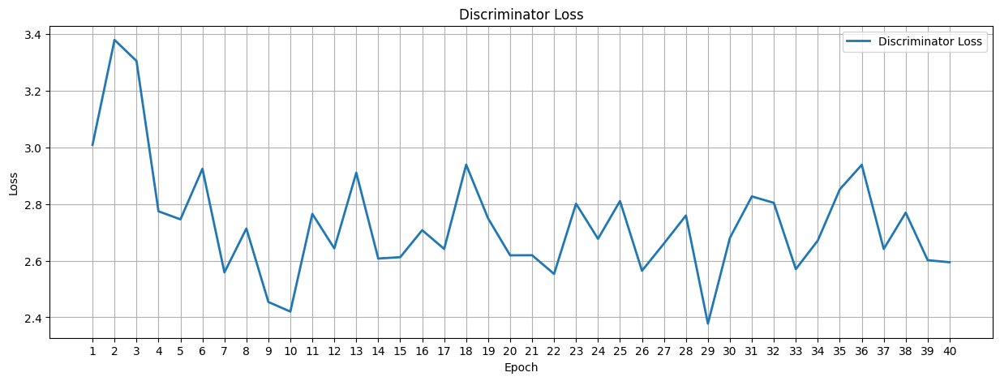

In [22]:
plt.figure(figsize=(15, 5))
epochs = list(range(1, len(loss_history.d_losses) + 1))
plt.plot(epochs, loss_history.d_losses, label="Discriminator Loss", linewidth=2)
plt.xticks(epochs)  
plt.title("Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# GENERATOR & DISCRIMINATOR ACCURACY 

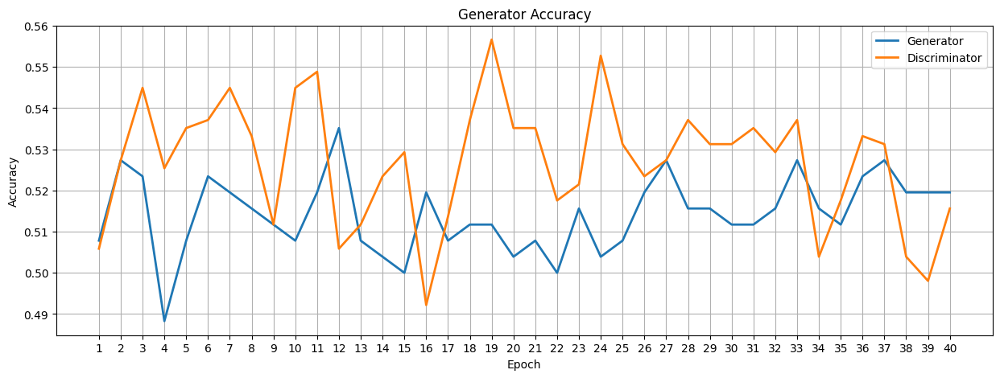

In [23]:
plt.figure(figsize=(15, 5))
epochs = list(range(1, len(loss_history.g_accs) + 1))
plt.plot(epochs, loss_history.g_accs, label="Generator", linewidth=2)
plt.plot(epochs, loss_history.d_accs, label="Discriminator", linewidth=2)
plt.xticks(epochs) 
plt.title("Generator Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(True)
plt.legend()
plt.show()

# CYCLE CONSISTENCY LOSS

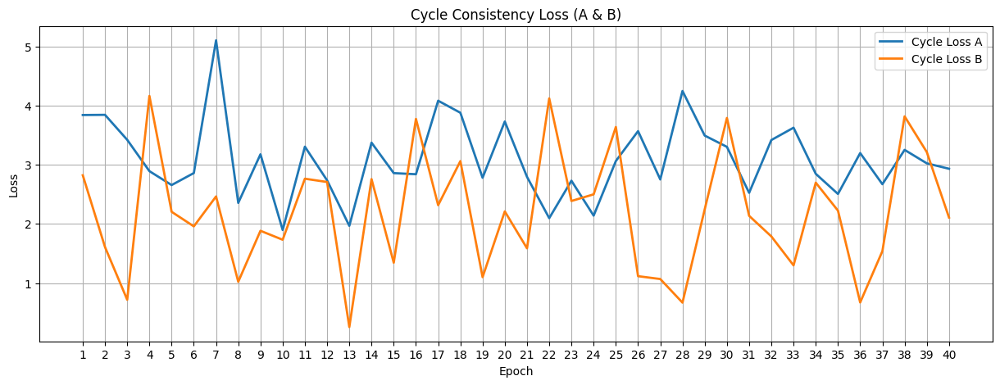

In [24]:
plt.figure(figsize=(15, 5))
epochs = list(range(1, len(loss_history.cycle_A) + 1))
plt.plot(epochs, loss_history.cycle_A, label="Cycle Loss A", linewidth=2)
plt.plot(epochs, loss_history.cycle_B, label="Cycle Loss B", linewidth=2)
plt.xticks(epochs) 
plt.title("Cycle Consistency Loss (A & B)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# GRADIENT NORM MONITORING

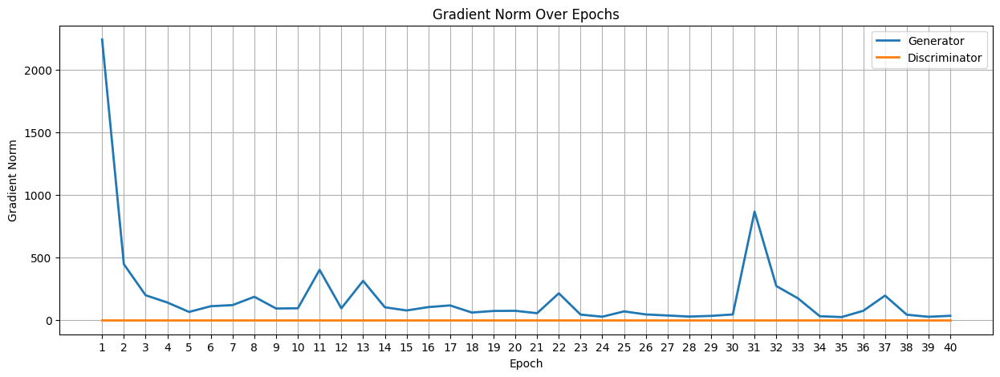

In [25]:
plt.figure(figsize=(15, 5))
epochs = list(range(1, len(loss_history.grad_g) + 1))
plt.plot(epochs, loss_history.grad_g, label="Generator", linewidth=2)
plt.plot(epochs, loss_history.grad_d, label="Discriminator", linewidth=2)
plt.xticks(epochs)  
plt.title("Gradient Norm Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Gradient Norm")
plt.grid(True)
plt.legend()
plt.show()

# IDENTITY LOSS

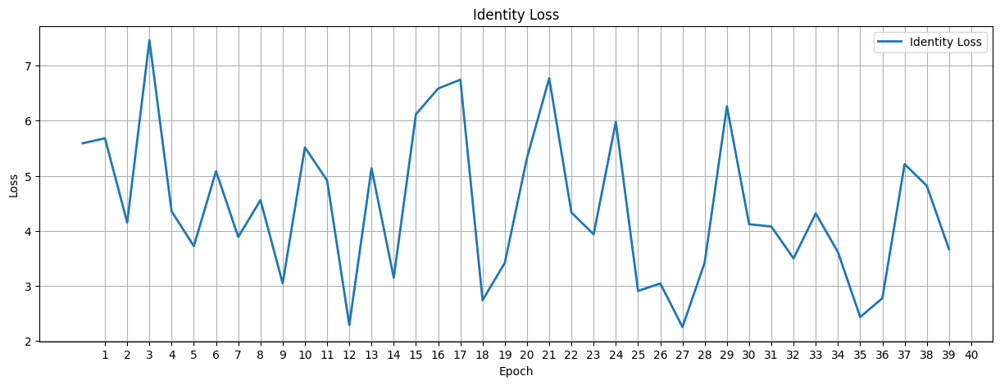

In [26]:
plt.figure(figsize=(15, 5))
epochs = list(range(1, len(loss_history.grad_g) + 1))
plt.plot(loss_history.identity, label="Identity Loss", linewidth=2)
plt.xticks(epochs)
plt.title("Identity Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# MODEL EVALUATION

## SSIM 

In [27]:
def evaluate_ssim_10_samples(generator, dataset, num_samples=10):
    fig, axes = plt.subplots(2, num_samples, figsize=(3*num_samples, 6))
    fig.subplots_adjust(wspace=0.15, hspace=0.15)

    scores = []

    for i, real_image in enumerate(dataset.take(num_samples)):
        fake_image = generator(real_image, training=False)

        real_vis = (real_image[0] + 1) / 2.0
        fake_vis = (fake_image[0] + 1) / 2.0

        raw_ssim = float(ssim(real_image, fake_image, max_val=2.0).numpy()[0])
        ssim_percent = raw_ssim * 100.0
        scores.append(ssim_percent)

        axes[0, i].imshow(real_vis)
        axes[0, i].set_title("Real", fontsize=12)
        axes[0, i].axis("off")

        axes[1, i].imshow(fake_vis)
        axes[1, i].set_title(f"SSIM : {ssim_percent:.1f}%", fontsize=12)
        axes[1, i].axis("off")

    plt.show()

    print("Average SSIM :", round(np.mean(scores), 2))
    return scores

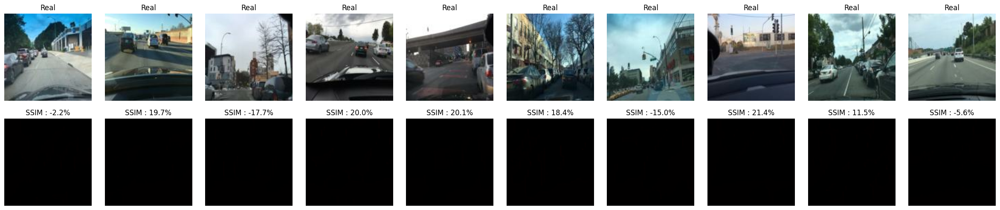

Average SSIM : 7.07


[-2.1601369604468346,
 19.723637402057648,
 -17.724883556365967,
 20.034615695476532,
 20.13119012117386,
 18.4069886803627,
 -14.979907870292664,
 21.397335827350616,
 11.460140347480774,
 -5.574164167046547]

In [28]:
evaluate_ssim_10_samples(gan.Gd2n, Day, num_samples=10)

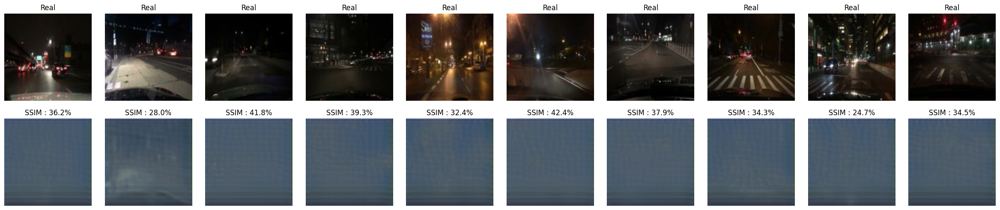

Average SSIM : 35.15


[36.1783891916275,
 27.98275053501129,
 41.79309904575348,
 39.32321071624756,
 32.362234592437744,
 42.442694306373596,
 37.85693645477295,
 34.33387279510498,
 24.690617620944977,
 34.52714383602142]

In [29]:
evaluate_ssim_10_samples(gan.Gn2d, Night, num_samples=10)

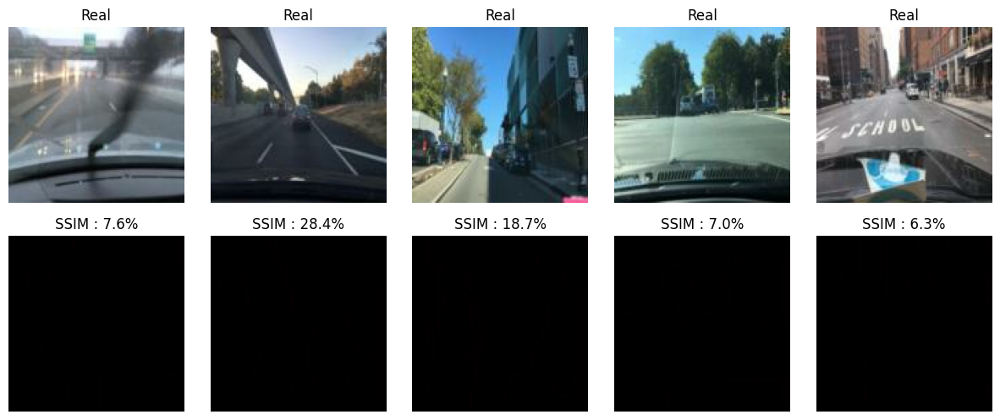

Average SSIM : 13.61


[7.642135769128799,
 28.440243005752563,
 18.727369606494904,
 6.989767402410507,
 6.254348158836365]

In [30]:
evaluate_ssim_10_samples(gan.Gd2n, Day, num_samples=5)

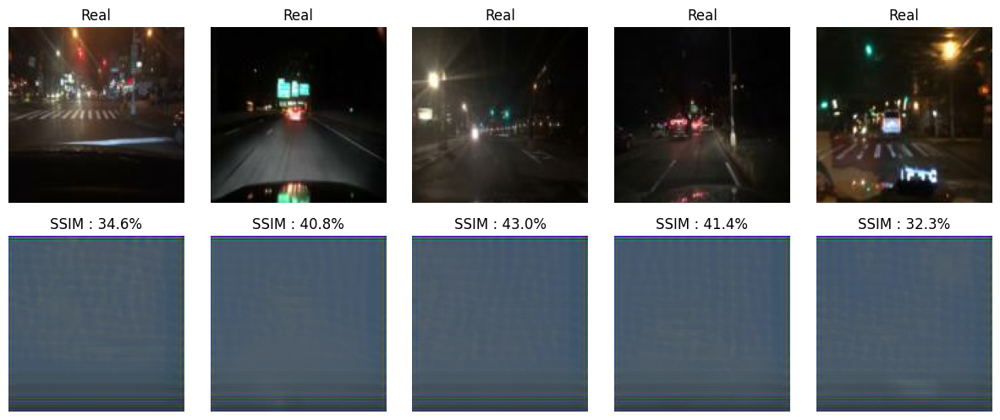

Average SSIM : 38.42


[34.57248508930206,
 40.841153264045715,
 42.95853674411774,
 41.4278507232666,
 32.3246568441391]

In [31]:
evaluate_ssim_10_samples(gan.Gn2d, Night, num_samples=5)

## FID

In [32]:
def evaluate_fid_5_samples(generator, dataset, num_samples=5):
    inception = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

    fig, axes = plt.subplots(2, num_samples, figsize=(3*num_samples, 6))
    fig.subplots_adjust(wspace=0.15, hspace=0.15)

    real_feats_all = []
    fake_feats_all = []

    def prep(img):
        img = (img + 1.0) * 127.5
        img = tf.image.resize(img, (299, 299))
        img = preprocess_input(img)
        return img

    def get_feat(img):
        img = tf.expand_dims(img, 0)
        feat = inception.predict(img, verbose=0)
        return feat[0]

    for i, real_batch in enumerate(dataset.take(num_samples)):
        real_img = real_batch[0]
        fake_img = generator(tf.expand_dims(real_img, 0), training=False)[0]

        real_vis = (real_img + 1) / 2.0
        fake_vis = (fake_img + 1) / 2.0

        real_prep = prep(real_img)
        fake_prep = prep(fake_img)

        real_feat = get_feat(real_prep)
        fake_feat = get_feat(fake_prep)

        real_feats_all.append(real_feat)
        fake_feats_all.append(fake_feat)

        diff = np.sum((real_feat - fake_feat)**2)

        axes[0, i].imshow(real_vis)
        axes[0, i].set_title("Real")
        axes[0, i].axis("off")

        axes[1, i].imshow(fake_vis)
        axes[1, i].set_title(f"DIST: {diff:.1f}")
        axes[1, i].axis("off")

    plt.show()
    real_feats_all = np.array(real_feats_all)
    fake_feats_all = np.array(fake_feats_all)

    mu1, sigma1 = real_feats_all.mean(axis=0), np.cov(real_feats_all, rowvar=False)
    mu2, sigma2 = fake_feats_all.mean(axis=0), np.cov(fake_feats_all, rowvar=False)

    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid_score = np.sum((mu1 - mu2)**2) + np.trace(sigma1 + sigma2 - 2 * covmean)

    print("FID :", fid_score)
    return fid_score

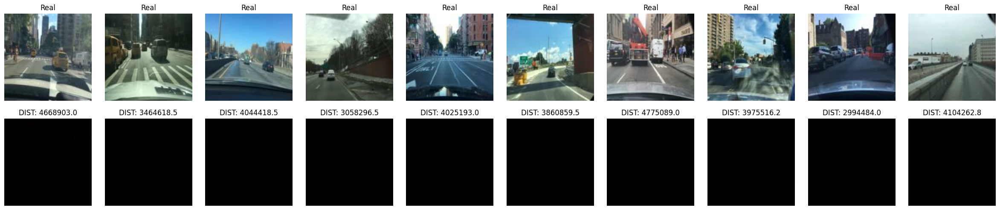

FID : 3905239.2575025493


In [33]:
fid_score = evaluate_fid_5_samples(generator=gan.Gd2n,dataset=Day,num_samples=10)

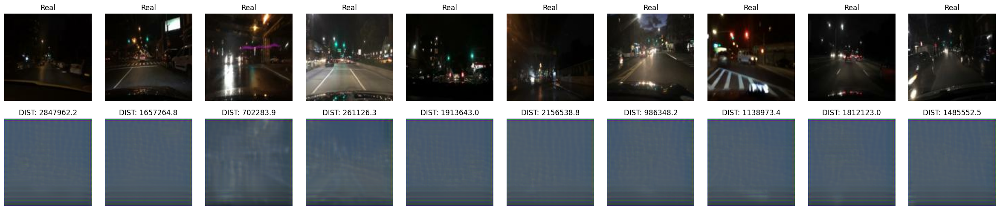

FID : 1463040.817784368


In [34]:
fid_score = evaluate_fid_5_samples(generator=gan.Gn2d,dataset=Night,num_samples=10)

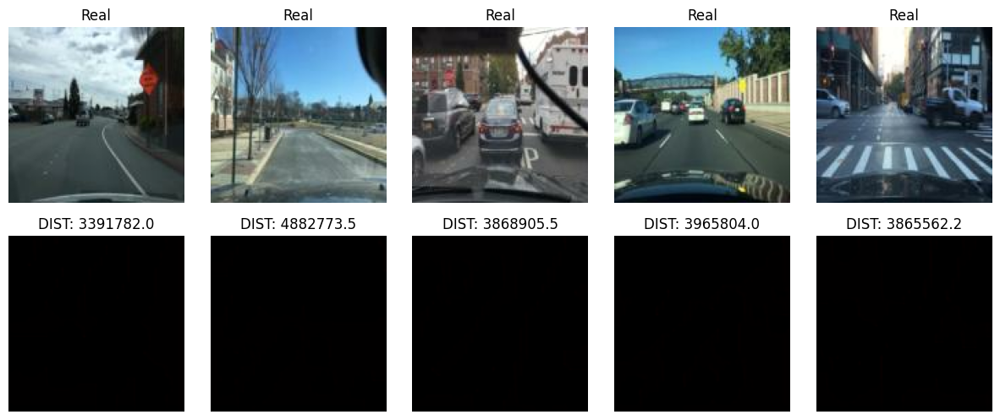

FID : 4015141.6842047977


In [35]:
fid_score = evaluate_fid_5_samples(generator=gan.Gd2n,dataset=Day,num_samples=5)

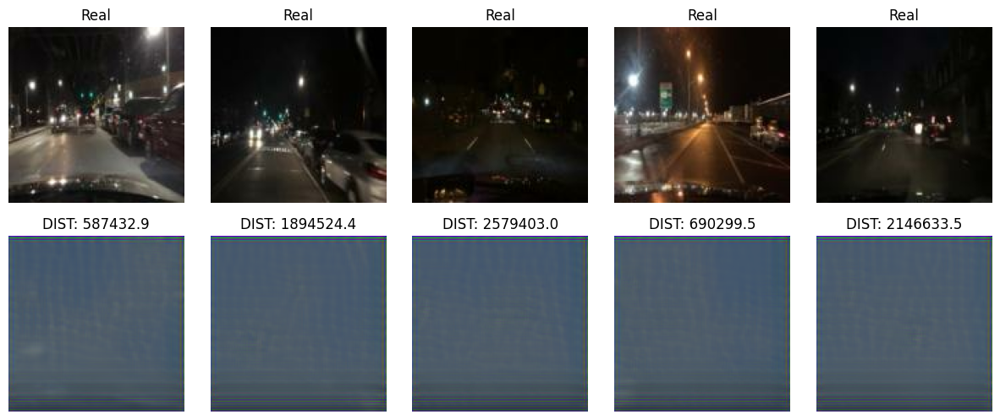

FID : 1625440.227339936


In [36]:
fid_score = evaluate_fid_5_samples(generator=gan.Gn2d,dataset=Night,num_samples=5)

# TESTING MODEL

## LOAD DATASET

In [39]:
day_test     = r"C:\MATTHEW\DATASET\Test\Day"
night_test   = r"C:\MATTHEW\DATASET\Test\Night"

day_test_resize   = r"C:\MATTHEW\DATASET\Test\Resized 128 x 128\Day"
night_test_resize = r"C:\MATTHEW\DATASET\Test\Resized 128 x 128\Night"

## PREPROCESS

In [40]:
def load_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (128, 128))   
    img = (tf.cast(img, tf.float32) / 127.5) - 1.0
    return img

## DATASET BUILDER

In [41]:
def make_dataset(folder, batch_size=1, shuffle=False):
    pattern = os.path.join(folder, "*")
    ds = tf.data.Dataset.list_files(pattern, shuffle=shuffle)
    ds = ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size)
    return ds

## IMAGE RESIZE

In [85]:
def resize_images(input_dir, output_dir, size=(128, 128)):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for f in os.listdir(input_dir):
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            input_path = os.path.join(input_dir, f)
            output_path = os.path.join(output_dir, f)
            try:
                img = Image.open(input_path)
                img = ImageOps.exif_transpose(img)
                img = img.convert("RGB")
                img = img.resize(size)
                img.save(output_path)
            except Exception as e:
                print(f"Gagal resize {f}: {e}")

resize_images(day_test, day_test_resize)
resize_images(night_test, night_test_resize)

## SHOW IMAGE

In [42]:
def show_10_samples(folder_path):
    valid_ext = (".jpg", ".jpeg", ".png")
    files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_ext)]

    if not files:
        print("No image files :", folder_path)
        return

    sample_files = random.sample(files, min(10, len(files)))

    rows, cols = 2, 5
    plt.figure(figsize=(22, 9))

    for i, filename in enumerate(sample_files, start=1):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path)
        img = ImageOps.exif_transpose(img).convert("RGB")
        plt.subplot(rows, cols, i)
        plt.imshow(img)
        plt.title(filename, fontsize=10)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### ORIGINAL IMAGE 

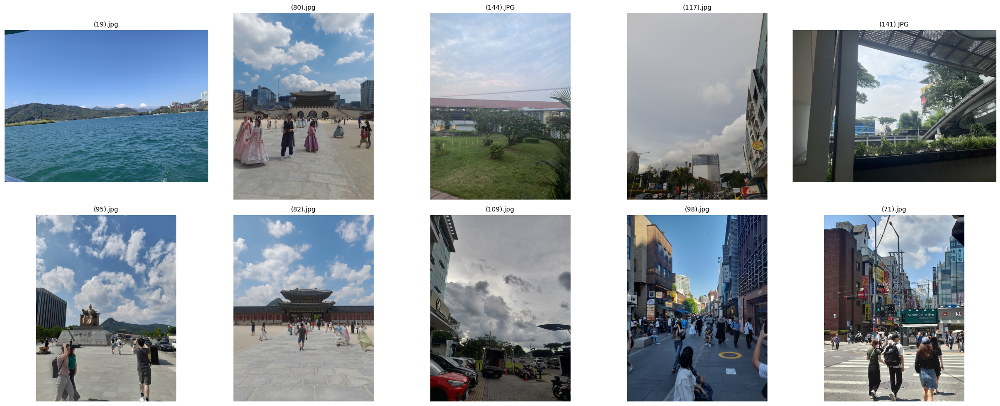

In [43]:
show_10_samples(day_test)

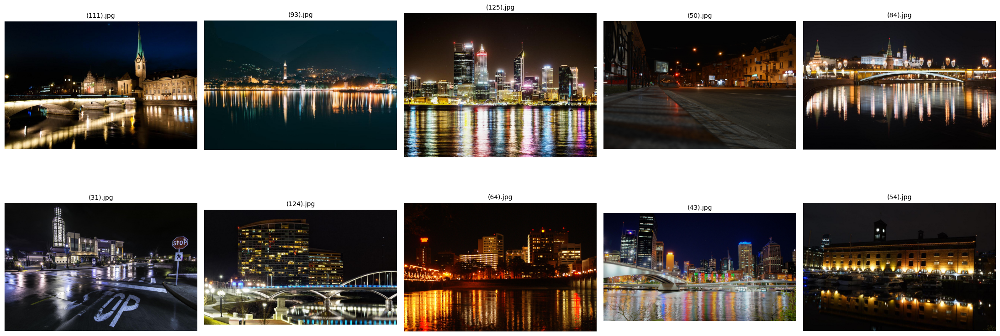

In [44]:
show_10_samples(night_test)

### RESIZE IMAGE (256x256)

In [45]:
show_images(day_test_resize, title="Day - Resized 256x256")

NameError: name 'show_images' is not defined

In [ ]:
show_images(night_test_resize, title="Night - Resized 256x256")

## SHOW OUTPUT 

In [ ]:
day_test_ds   = make_dataset(day_test_resize)
night_test_ds = make_dataset(night_test_resize)

def visualize_generator_outputs(generator, dataset, num_samples=8, title="Preview"):
    fig, axes = plt.subplots(2, num_samples, figsize=(3*num_samples, 6))
    fig.suptitle(title, fontsize=16)
    fig.subplots_adjust(wspace=0.15, hspace=0.15)

    for i, real_image in enumerate(dataset.take(num_samples)):
        fake_image = generator(real_image, training=False)

        real_vis = ((real_image[0] + 1) / 2.0).numpy()
        fake_vis = ((fake_image[0] + 1) / 2.0).numpy()

        axes[0, i].imshow(real_vis)
        axes[0, i].set_title("Real", fontsize=12)
        axes[0, i].axis("off")

        axes[1, i].imshow(fake_vis)
        axes[1, i].set_title("Fake", fontsize=12)
        axes[1, i].axis("off")

    plt.show()

In [ ]:
visualize_generator_outputs(gan.Gn2d, night_test_ds, num_samples=10, title="Night → Day")

In [ ]:
visualize_generator_outputs(gan.Gd2n, day_test_ds, num_samples=10, title="Day → Night")

In [ ]:
visualize_generator_outputs(gan.Gn2d, night_test_ds, num_samples=5, title="Night → Day")

In [ ]:
visualize_generator_outputs(gan.Gd2n, day_test_ds, num_samples=5, title="Day → Night")